# SVM

In [29]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.io # for loading .mat files
import scipy.optimize
from sklearn import svm

### 1. Load and visualize the data

In [30]:
datafile = 'data/ex6data1.mat'
data = scipy.io.loadmat(datafile)
X = data['X']
y = data['y']
pos = np.array([X[i] for i in range(X.shape[0]) if y[i]==1])
neg = np.array([X[i] for i in range(X.shape[0]) if y[i]==0])

In [35]:
def plotData():
    plt.figure(figsize=(8,6))
    plt.plot(pos[:,0], pos[:,1], 'r+', label='Positive')
    plt.plot(neg[:,0], neg[:,1], 'go', label='Negative')
    plt.xlabel('Variable 1')
    plt.ylabel('Variable 2')
    plt.legend(loc=4)
    plt.grid(True)

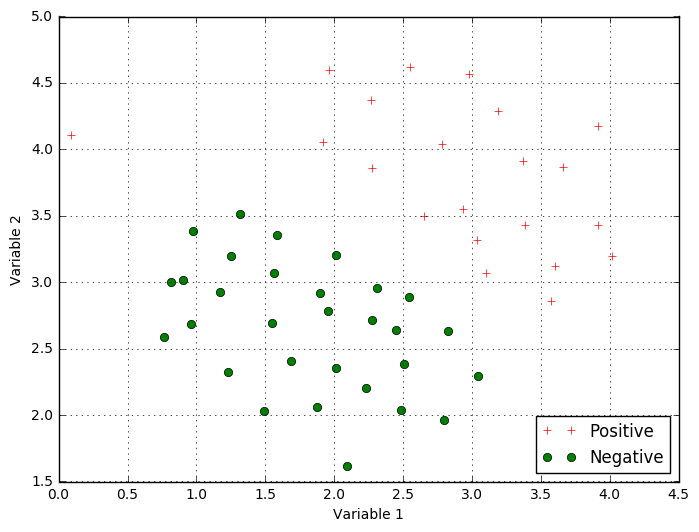

In [36]:
plotData()

### 2. Plot boundary

In [37]:
def plotBoundary(svm_res, xmin, xmax, ymin, ymax, C):
    xvals = np.linspace(xmin,xmax,100)
    yvals = np.linspace(ymin,ymax,100)
    zvals = np.zeros((len(xvals), len(yvals)))
    for i in range(len(xvals)):
        for j in range(len(yvals)):
            zvals[i][j] = float(svm_res.predict(np.array([xvals[i],yvals[j]])))
    zvals = zvals.T
    np.meshgrid(xvals, yvals)
    contour = plt.contour(xvals, yvals, zvals)
    #contour = plt.contourf(xvals, yvals, zvals)
    plt.title("Decision Boundary with C={}" .format(C))
    return zvals

C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C

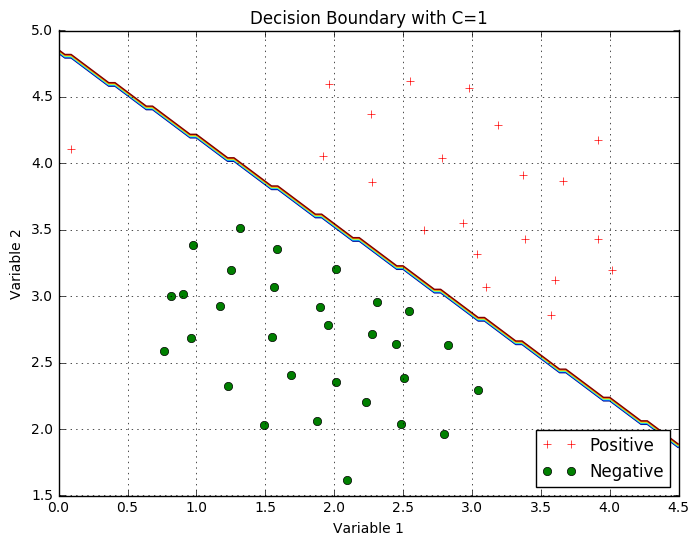

In [38]:
linear_svm = svm.SVC(C=1, kernel='linear')
linear_svm.fit(X, y.flatten())
plotData()
zvals = plotBoundary(linear_svm, 0, 4.5, 1.5, 5, 1)

C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C

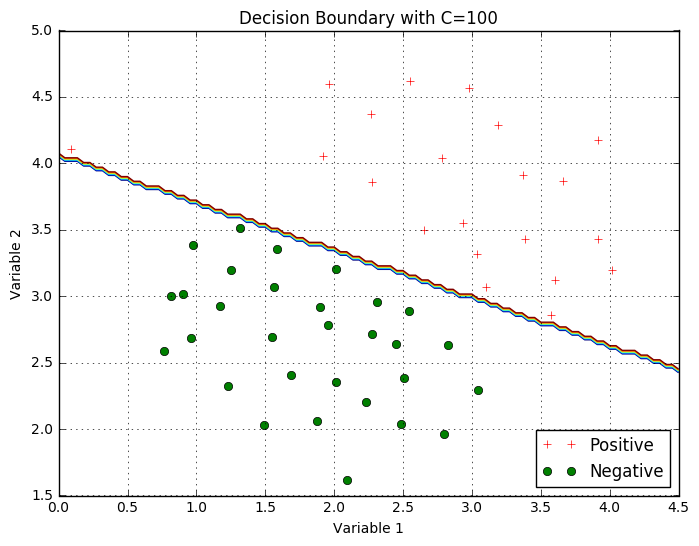

In [39]:
linear_svm = svm.SVC(C=100, kernel='linear')
linear_svm.fit(X, y.flatten())
plotData()
zvals = plotBoundary(linear_svm, 0, 4.5, 1.5, 5, 100)

### 3. SVM with Gaussian Kernels

In [40]:
def gaussKernel(x1, x2, sigma):
    return np.exp(-np.sum(np.square(x1-x2))/(2*np.power(sigma,2)))

In [41]:
print (gaussKernel(np.array([1,2,1]), np.array([0,4,-1]), 2))

0.324652467358


In [42]:
np.array([1,2,1]).shape

(3,)

#### 3.1 Example Dataset 2

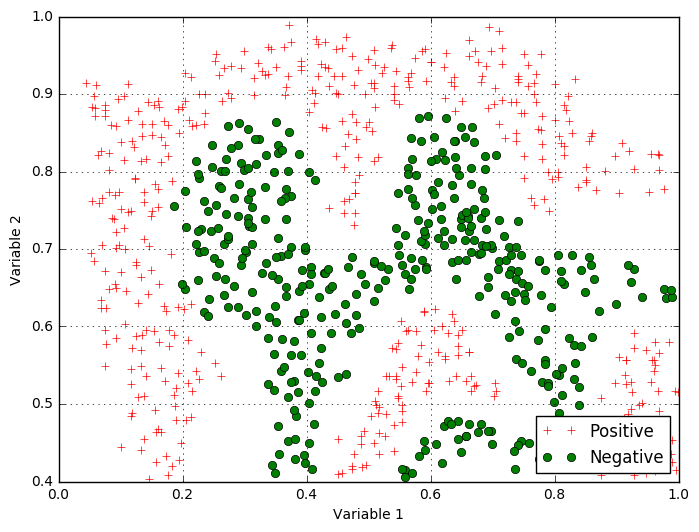

In [43]:
datafile = 'data/ex6data2.mat'
data = scipy.io.loadmat(datafile)
X = data['X']
y = data['y']
pos = np.array([X[i] for i in range(X.shape[0]) if y[i]==1])
neg = np.array([X[i] for i in range(X.shape[0]) if y[i]==0])
plotData()

C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C

array([[ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       ..., 
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.]])

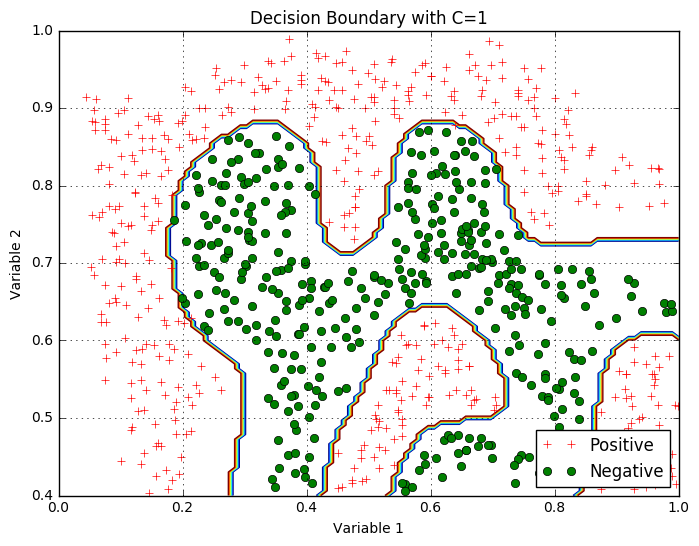

In [44]:
sigma = 0.1
gamma = np.power(sigma, -2)
gauss_svm = svm.SVC(C=1, kernel='rbf', gamma=gamma)
gauss_svm.fit(X, y.flatten())
plotData()
plotBoundary(gauss_svm, 0, 1, 0.4, 1.0, 1)

#### 3.2 Example Dataset 3

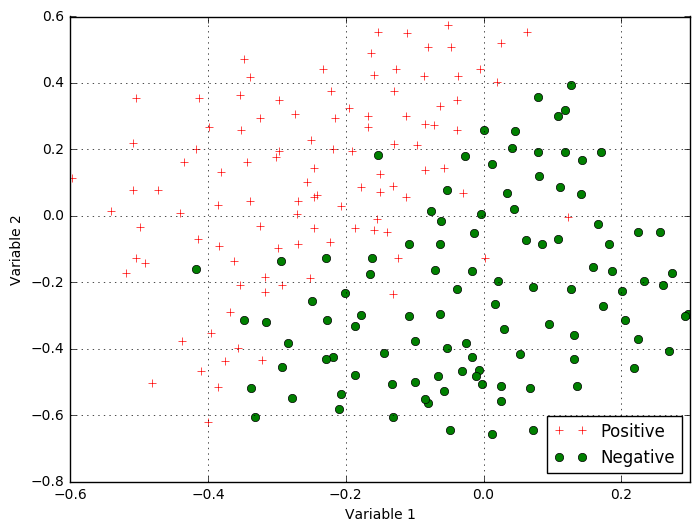

In [45]:
datafile = 'data/ex6data3.mat'
data = scipy.io.loadmat(datafile)
X = data['X']
y = data['y']
pos = np.array([X[i] for i in range(X.shape[0]) if y[i]==1])
neg = np.array([X[i] for i in range(X.shape[0]) if y[i]==0])
plotData()

In [46]:
data.keys()

dict_keys(['__header__', 'Xval', 'yval', '__version__', 'y', 'X', '__globals__'])

In [47]:
Xval = data['Xval']
yval = data['yval']

In [48]:
C_list = (0.01, 0.03, 0.1, 0.3, 1., 3., 10., 30.)
sigma_list = C_list
best_pair = (0, 0)
score_max = 0

for Cvalue in C_list:
    for sigmavalue in sigma_list:
        gamma = np.power(sigmavalue, -2)
        gauss_svm = svm.SVC(C=Cvalue, kernel='rbf', gamma=gamma)
        gauss_svm.fit(X, y.flatten())
        score_current = gauss_svm.score(Xval, yval)
        if score_current>score_max:
            score_max = score_current
            best_pair = (Cvalue, sigmavalue)

print ('The best choice of C and sigma is (%f, %f).' %(best_pair[0], best_pair[1]))

The best choice of C and sigma is (0.300000, 0.100000).


C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

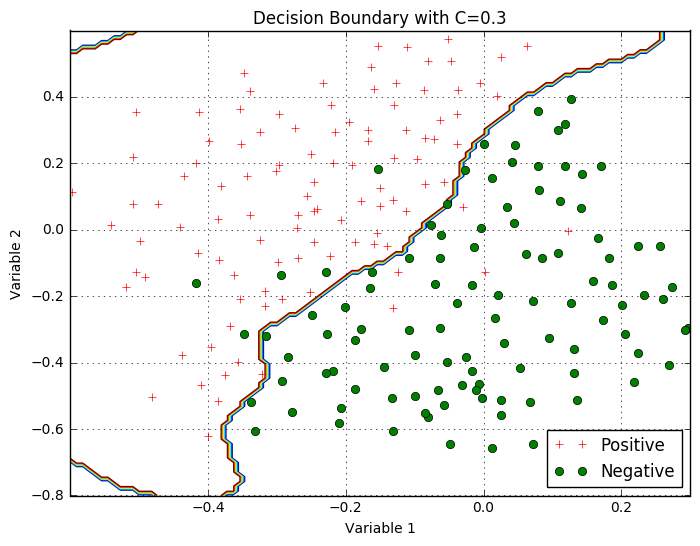

In [49]:
gamma = np.power(best_pair[1], -2)
gauss_svm = svm.SVC(C=best_pair[0], kernel='rbf', gamma=gamma)
gauss_svm.fit(X, y.flatten())
plotData()
plotBoundary(gauss_svm, -0.6, 0.3, -0.8, 0.6, best_pair[0])